# California Housing Prediction Machine Learning Project

### Objectives

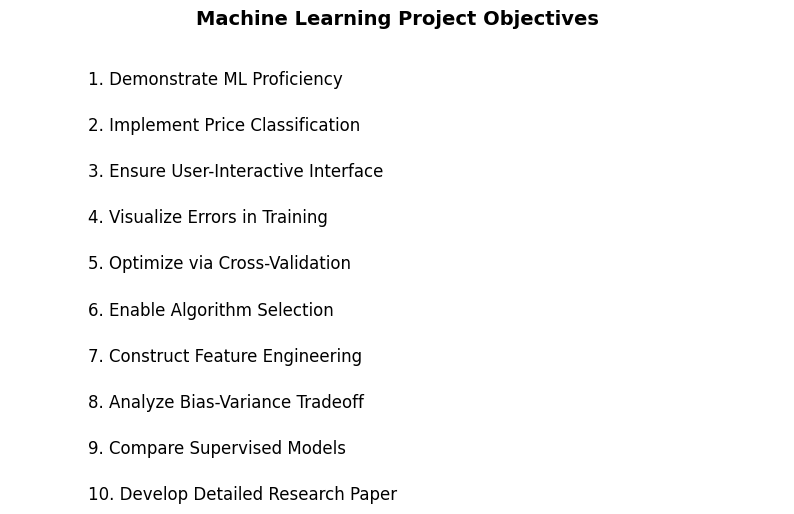

In [36]:
import matplotlib.pyplot as plt  # 📦 Importing necessary library

# Define objectives
objectives = [
    "Demonstrate ML Proficiency",
    "Implement Price Classification",
    "Ensure User-Interactive Interface",
    "Visualize Errors in Training",
    "Optimize via Cross-Validation",
    "Enable Algorithm Selection",
    "Construct Feature Engineering",
    "Analyze Bias-Variance Tradeoff",
    "Compare Supervised Models",
    "Develop Detailed Research Paper"
]

# Create figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Add text for each objective
for i, obj in enumerate(objectives, start=1):
    ax.text(0.1, 1 - (i * 0.1), f"{i}. {obj}", fontsize=12, verticalalignment='center')

# Remove axes
ax.set_xticks([])
ax.set_yticks([])
ax.set_frame_on(False)

# Title
ax.set_title("Machine Learning Project Objectives", fontsize=14, fontweight='bold')

# Show plot
plt.show()

### The Pipeline

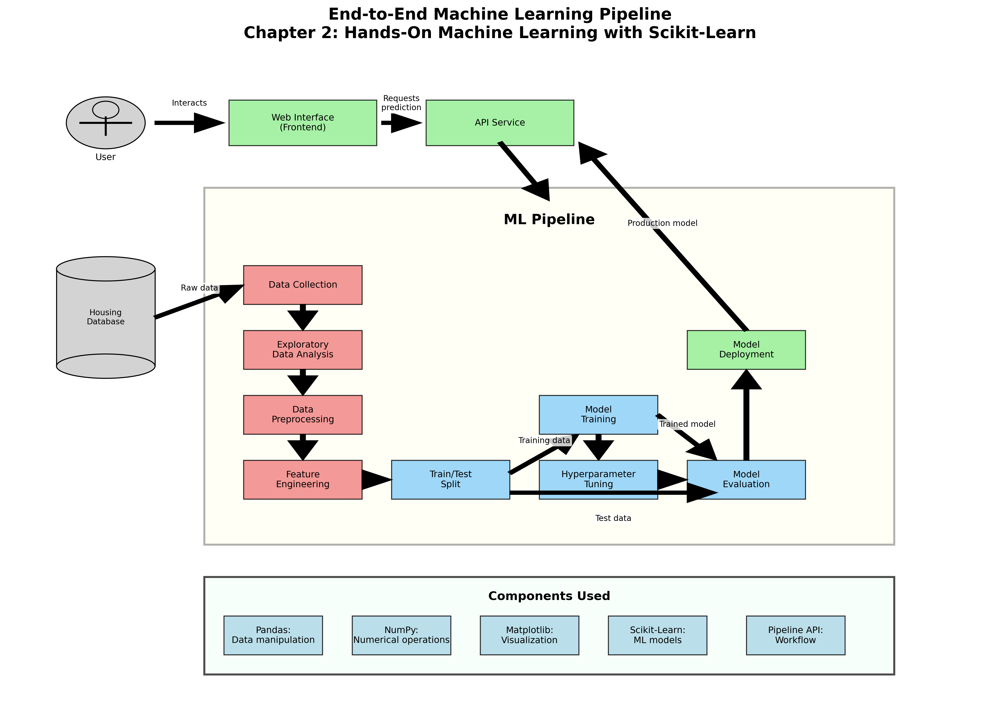

In [37]:
from IPython.display import Image, display  # 📦 Importing necessary library

# Display an image (PNG, JPG, etc.)
img = Image(filename="ml_pipeline.png")  # If the image is in the same directory
display(img)


### The Data

#### Basic Overview

In [38]:
import pandas as pd  # 📦 Importing necessary library
import numpy as np  # 📦 Importing necessary library

df = pd.read_csv('housing.csv')  # 📥 Loading the dataset from CSV file


In [39]:
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [41]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [42]:
df.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [43]:
df.dtypes

longitude             float64
latitude              float64
housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
median_house_value    float64
ocean_proximity        object
dtype: object

#### Relational Overview

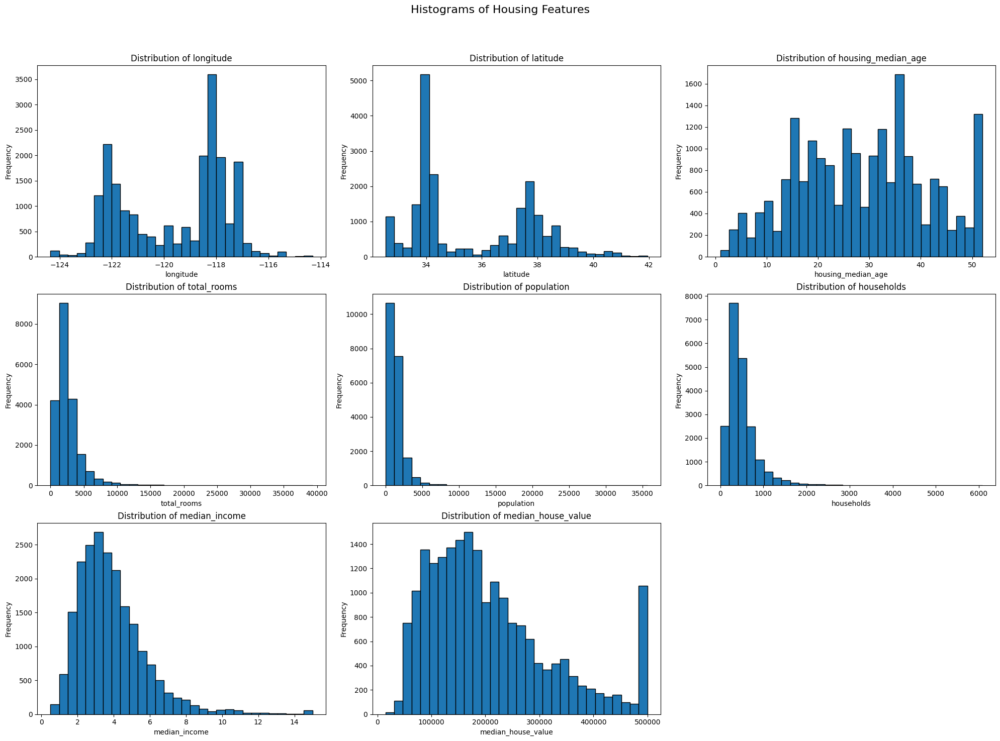

In [44]:
import matplotlib.pyplot as plt  # 📦 Importing necessary library
import seaborn as sns  # 📦 Importing necessary library
import numpy as np  # 📦 Importing necessary library
import matplotlib.pyplot as plt  # 📦 Importing necessary library

# Basic histograms for numerical features
plt.figure(figsize=(20, 15))

# Get all numeric columns except total_bedrooms (which has missing values)
numeric_cols = ['longitude', 'latitude', 'housing_median_age', 
                'total_rooms', 'population', 'households', 
                'median_income', 'median_house_value']

# Plot histograms in a grid
for i, column in enumerate(numeric_cols):
    plt.subplot(3, 3, i+1)
    plt.hist(df[column], bins=30, edgecolor='black')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.tight_layout()

plt.subplots_adjust(top=0.9)
plt.suptitle('Histograms of Housing Features', fontsize=16)

# Show the histogram plots
plt.show()

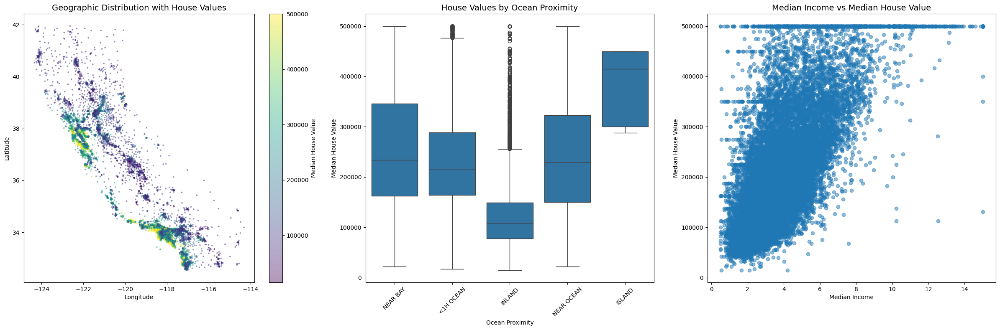

In [45]:
# Set up a single figure with three subplots
fig, axes = plt.subplots(1, 3, figsize=(24, 8))

# Scatter plot of longitude vs latitude
sc = axes[0].scatter(df['longitude'], df['latitude'], alpha=0.4, 
                      c=df['median_house_value'], cmap='viridis', s=3)
axes[0].set_title('Geographic Distribution with House Values', fontsize=14)
axes[0].set_xlabel('Longitude')
axes[0].set_ylabel('Latitude')
fig.colorbar(sc, ax=axes[0], label='Median House Value')

# Box plot for ocean_proximity
sns.boxplot(x='ocean_proximity', y='median_house_value', data=df, ax=axes[1])
axes[1].set_title('House Values by Ocean Proximity', fontsize=14)
axes[1].set_xlabel('Ocean Proximity')
axes[1].set_ylabel('Median House Value')
axes[1].tick_params(axis='x', rotation=45)

# Scatter plot of income vs house value
axes[2].scatter(df['median_income'], df['median_house_value'], alpha=0.5)
axes[2].set_title('Median Income vs Median House Value', fontsize=14)
axes[2].set_xlabel('Median Income')
axes[2].set_ylabel('Median House Value')

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


### Test Sets

<Axes: >

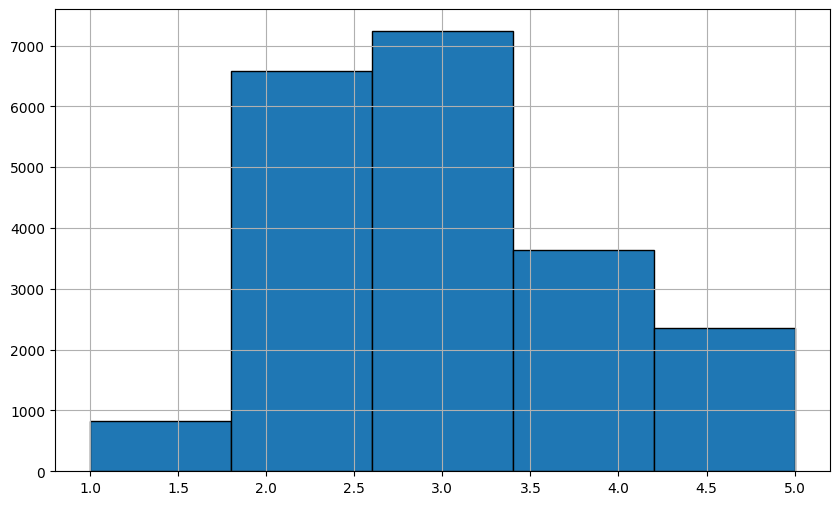

In [46]:
df["income_cat"] = pd.cut(df["median_income"],  # 🧮 Creating income categories for stratified sampling
bins=[0., 1.5, 3.0, 4.5, 6., np.inf],
labels=[1, 2, 3, 4, 5])


# plot the histogram of this bin with labels
plt.figure(figsize=(10, 6))
df["income_cat"].hist(bins=5, edgecolor='black')

In [47]:
# Median Income is a very important attribute for predictiom, hence stratified sampling  # 📈 Making predictions using the trained model

# Stratified Sampling of Class housing_cat With Train, Test, Split.

from sklearn.model_selection import train_test_split  # 📦 Importing necessary library
from sklearn.model_selection import StratifiedShuffleSplit  # 📦 Importing necessary library


strat_train_set, strat_test_set = train_test_split(df, test_size=0.2, random_state=42, stratify=df['income_cat'])  # ✂️ Splitting data into training and test sets


### Greater Visualization For Further Insights

In [48]:
housing = strat_train_set.copy()

#### Geographical Data

In [49]:
import folium  # 📦 Importing necessary library
import pandas as pd  # 📦 Importing necessary library

# Load the dataset
housing = pd.read_csv("housing.csv")  # 📥 Loading the dataset from CSV file

# Create a base map centered at California
m = folium.Map(location=[housing["latitude"].mean(), housing["longitude"].mean()], zoom_start=6)

# Add data points to the map
for _, row in housing.iterrows():
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=2,  # Size of the marker
        color="blue",
        fill=True,
        fill_color="blue",
        fill_opacity=0.2
    ).add_to(m)

# Display the interactive map
m


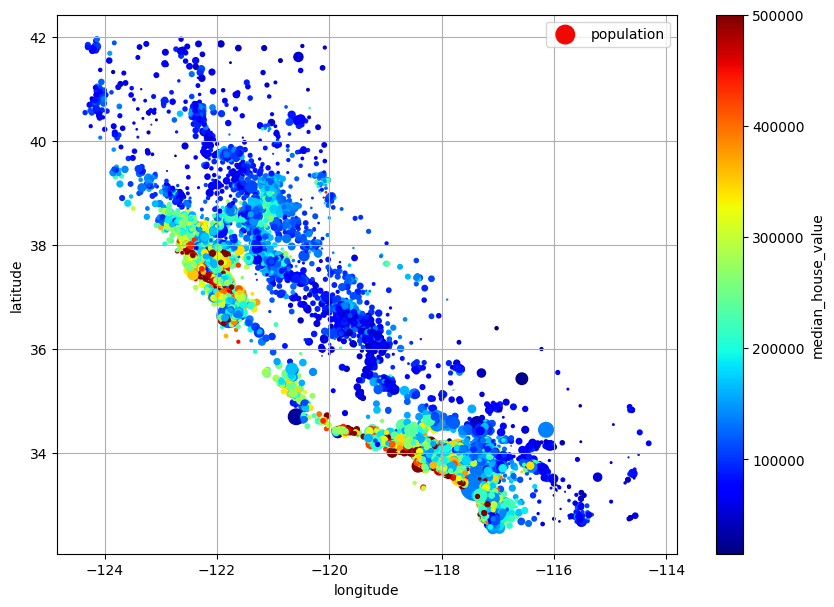

In [50]:
# Now visualizing with the prices

housing.plot(kind="scatter", x="longitude", y="latitude", grid=True,
s=housing["population"] / 100, label="population",
c="median_house_value", cmap="jet", colorbar=True,
legend=True, sharex=False, figsize=(10, 7))
plt.show()


### Correlation

In [51]:
corr_matrix = housing.select_dtypes(include=[np.number]).corr()

In [52]:
# Looking At The Correlation Matrix For Median House Value
corr_matrix["median_house_value"].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.688075
total_rooms           0.134153
housing_median_age    0.105623
households            0.065843
total_bedrooms        0.049686
population           -0.024650
longitude            -0.045967
latitude             -0.144160
Name: median_house_value, dtype: float64

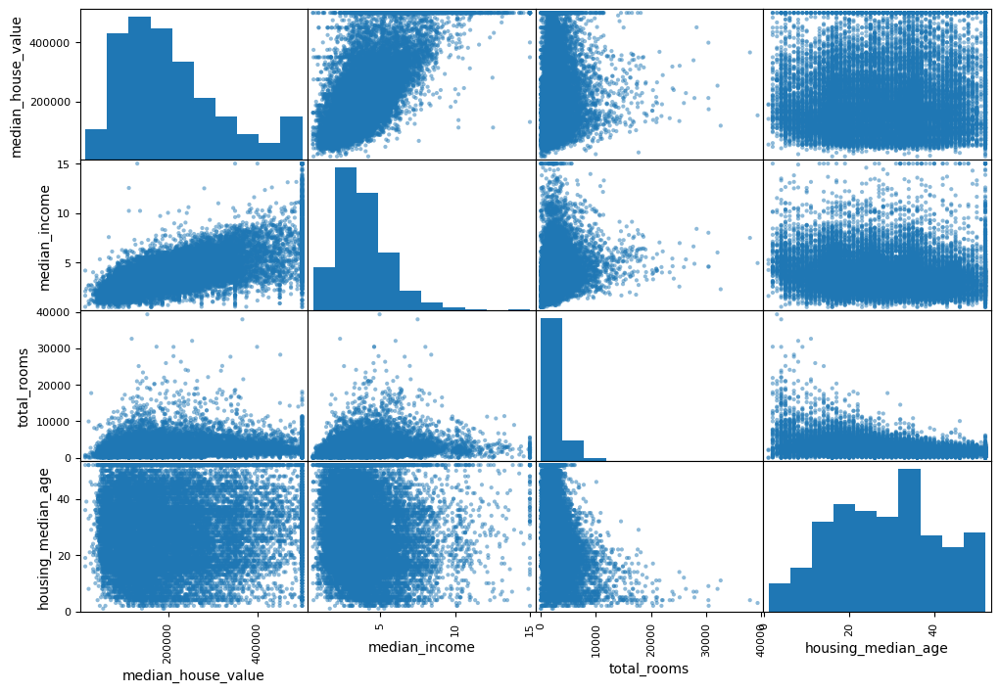

In [53]:
from pandas.plotting import scatter_matrix  # 📦 Importing necessary library
attributes = ["median_house_value", "median_income", "total_rooms",
"housing_median_age"]
scatter_matrix(housing[attributes], figsize=(12, 8))
plt.show()

<Axes: xlabel='median_income', ylabel='median_house_value'>

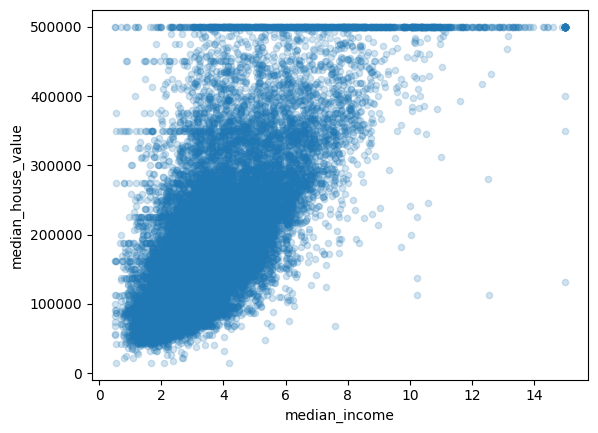

In [54]:
housing.plot(kind="scatter", x="median_income", y="median_house_value", alpha = 0.2)

### Creating Newer Attributes

In [55]:
housing["rooms_per_house"] = housing["total_rooms"] / housing["households"]
housing["bedrooms_ratio"] = housing["total_bedrooms"] / housing["total_rooms"]
housing["people_per_house"] = housing["population"] / housing["households"]

In [56]:
corr_matrix = housing.select_dtypes(include=[np.number]).corr()
corr_matrix["median_house_value"].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.688075
rooms_per_house       0.151948
total_rooms           0.134153
housing_median_age    0.105623
households            0.065843
total_bedrooms        0.049686
people_per_house     -0.023737
population           -0.024650
longitude            -0.045967
latitude             -0.144160
bedrooms_ratio       -0.255880
Name: median_house_value, dtype: float64

### Preparing For ML Algorithms

#### Having a Clean Set

In [57]:
housing = strat_train_set.drop("median_house_value", axis = 1) # having the only set
housing_labels = strat_train_set["median_house_value"].copy() # having the labels seperately

#### Fixing Missing Attributes

In [58]:
from sklearn.impute import SimpleImputer  # 📦 Importing necessary library

imputer = SimpleImputer(strategy= 'median')  # 🔧 Handling missing values


housing_num = housing.select_dtypes(include = [np.number])


imputer.fit(housing_num)


# replacing the missing values

X = imputer.transform(housing_num)


# replacing the scipy matrix to pd

housing_tr = pd.DataFrame(X, columns= housing_num.columns, index = housing_num.index)


#### Handling Categorial Attributes

In [59]:
housing_cat = housing[["ocean_proximity"]]

from sklearn.preprocessing import OrdinalEncoder  # 📦 Importing necessary library

encoder = OrdinalEncoder()

housing_cat_encoded = encoder.fit_transform(housing_cat)  # 🚀 Applying transformations and fitting to data


encoder.categories_

[array(['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
       dtype=object)]

In [60]:
# One hot encoding since catergoes of 0,1,2,3 are very distinct and has no relation in terms of scaleness

from sklearn.preprocessing import OneHotEncoder #remembering which categories its trained on  # 📦 Importing necessary library

one_hot_encoder = OneHotEncoder()  # 🔣 Converting categorical values into binary vectors

housing_cat_onehot = one_hot_encoder.fit_transform(housing_cat)  # 🚀 Applying transformations and fitting to data

In [61]:
one_hot_encoder.get_feature_names_out()

array(['ocean_proximity_<1H OCEAN', 'ocean_proximity_INLAND',
       'ocean_proximity_ISLAND', 'ocean_proximity_NEAR BAY',
       'ocean_proximity_NEAR OCEAN'], dtype=object)

### Feature Scaling

In [62]:
from sklearn.preprocessing import MinMaxScaler  # 📦 Importing necessary library

min_max_scale = MinMaxScaler(feature_range=(-1,1))

housing_num_min_max_scaled = min_max_scale.fit_transform(housing_num)  # 🚀 Applying transformations and fitting to data


In [63]:
import pandas as pd  # 📦 Importing necessary library

# Creating a DataFrame for the feature transformation summary
feature_transformation_df = pd.DataFrame({
    "Feature": [
        "Median Income (median_income)",
        "Housing Median Age (housing_median_age)",
        "Total Rooms (total_rooms)",
        "Total Bedrooms (total_bedrooms)",
        "Population (population)",
        "Households (households)",
        "Latitude (latitude) & Longitude (longitude)",
        "Proximity to Ocean (ocean_proximity)"
    ],
    "Problem": [
        "Skewed distribution (right-heavy tail)",
        "Multimodal distribution (e.g., two peaks: new & old houses)",
        "Heavy right tail (few houses have very high room counts)",
        "Missing values + Right-skewed distribution",
        "Power law distribution (few areas have very large populations)",
        "Right-skewed distribution",
        "Geographical feature, not numeric",
        "Categorical feature"
    ],
    "Transformation": [
        "Log transformation OR Bucketizing (percentiles)",
        "Bucketizing + One-Hot Encoding OR Radial Basis Function (RBF)",
        "Log transformation OR Divide by households (rooms_per_household)",
        "Imputation (median) + Divide by rooms (bedrooms_per_room)",
        "Log transformation OR Divide by households (population_per_household)",
        "Log transformation",
        "Cluster-based encoding OR RBF similarity to key locations",
        "One-Hot Encoding"
    ],
    "Why It Helps?": [
        "Prevents extreme values from dominating the model. Ensures smooth learning.",
        "Allows the model to learn separate rules for old vs. new houses.",
        "Normalizes the scale and makes room count more meaningful.",
        "Prevents bias from missing data and makes feature more interpretable.",
        "Controls outliers and makes population distribution more normal.",
        "Reduces extreme values, making learning more stable.",
        "Captures regional effects instead of treating them as plain numbers.",
        "Allows the model to learn price differences between inland and coastal areas."
    ]
})

feature_transformation_df


,Feature,Problem,Transformation,Why It Helps?
0,Median Income (median_income),Skewed distribution (right-heavy tail),Log transformation OR Bucketizing (percentiles),Prevents extreme values from dominating the mo...
1,Housing Median Age (housing_median_age),"Multimodal distribution (e.g., two peaks: new ...",Bucketizing + One-Hot Encoding OR Radial Basis...,Allows the model to learn separate rules for o...
2,Total Rooms (total_rooms),Heavy right tail (few houses have very high ro...,Log transformation OR Divide by households (ro...,Normalizes the scale and makes room count more...
3,Total Bedrooms (total_bedrooms),Missing values + Right-skewed distribution,Imputation (median) + Divide by rooms (bedroom...,Prevents bias from missing data and makes feat...
4,Population (population),Power law distribution (few areas have very la...,Log transformation OR Divide by households (po...,Controls outliers and makes population distrib...
5,Households (households),Right-skewed distribution,Log transformation,"Reduces extreme values, making learning more s..."
6,Latitude (latitude) & Longitude (longitude),"Geographical feature, not numeric",Cluster-based encoding OR RBF similarity to ke...,Captures regional effects instead of treating ...
7,Proximity to Ocean (ocean_proximity),Categorical feature,One-Hot Encoding,Allows the model to learn price differences be...


In [64]:
from sklearn.metrics.pairwise import rbf_kernel  # 📦 Importing necessary library

age_sim_35 = rbf_kernel(housing[['housing_median_age']], [[35]], gamma = 0.1)

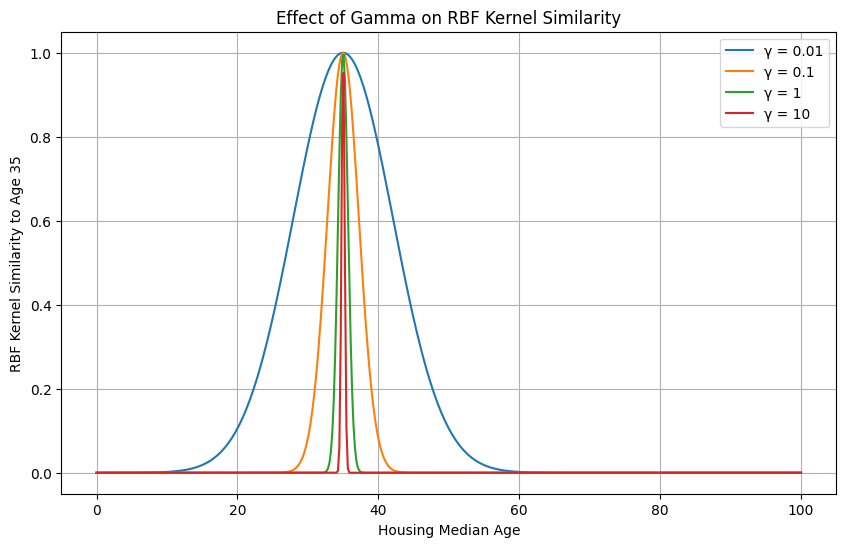

In [65]:
import numpy as np  # 📦 Importing necessary library
import matplotlib.pyplot as plt  # 📦 Importing necessary library
from sklearn.metrics.pairwise import rbf_kernel  # 📦 Importing necessary library
import pandas as pd  # 📦 Importing necessary library

# Generate a range of housing median ages (0 to 100 years)
age_range = np.linspace(0, 100, 500).reshape(-1, 1)
reference_age = np.array([[35]])  # Reference point (35 years old)

# Different gamma values to test
gamma_values = [0.01, 0.1, 1, 10]

# Compute RBF kernel similarities for different gamma values
plt.figure(figsize=(10, 6))
for gamma in gamma_values:
    age_sim = rbf_kernel(age_range, reference_age, gamma=gamma)
    plt.plot(age_range, age_sim, label=f'γ = {gamma}')

# Plot formatting
plt.title('Effect of Gamma on RBF Kernel Similarity')
plt.xlabel('Housing Median Age')
plt.ylabel('RBF Kernel Similarity to Age 35')
plt.legend()
plt.grid(True)
plt.show()


In [66]:
from sklearn.compose import TransformedTargetRegressor  # 📦 Importing necessary library
from sklearn.linear_model import LinearRegression  # 📦 Importing necessary library
from sklearn.preprocessing import StandardScaler  # 📦 Importing necessary library

model = TransformedTargetRegressor(LinearRegression(), transformer=StandardScaler())  # 🔍 Feature scaling for numerical stability

model.fit(housing[['median_income']], housing_labels)

TransformedTargetRegressor(regressor=LinearRegression(),
                           transformer=StandardScaler())

### Custom Transformers

#### Fixing Long-Tail Distributions

In [67]:
from sklearn.preprocessing import FunctionTransformer  # 📦 Importing necessary library

ft = FunctionTransformer(np.log, inverse_func= np.exp)

log_pop = ft.transform()

TypeError: FunctionTransformer.transform() missing 1 required positional argument: 'X'

#### Gaussian RBF Similarity

In [68]:
rbf_trans = FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[35.]], gamma=0.1))

age_sim = rbf_trans.transform(housing[["housing_median_age"]])

#### Geographic Similarity Between Sanfranscisco & Others

In [69]:
sf_coords = 37.7749,
-122.41

sf_transformer = FunctionTransformer(rbf_kernel, kw_args= dict(Y=[sf_coords], gamma = 0.1))

sf_simil = sf_transformer.transform(housing[["latitude",
"longitude"]])

ValueError: Incompatible dimension for X and Y matrices: X.shape[1] == 2 while Y.shape[1] == 1

#### Full on Custom Transformer

In [70]:
from sklearn.base import BaseEstimator, TransformerMixin  # 📦 Importing necessary library
from sklearn.utils.validation import check_array, check_is_fitted  # 📦 Importing necessary library


class StandardScalerClone(BaseEstimator, TransformerMixin):  # 🔍 Feature scaling for numerical stability
    def __init__(self , with_mean = True):
        self.with_mean = with_mean

    









































#### Forming Clusters Between Districts

In [71]:
from sklearn.base import BaseEstimator, TransformerMixin  # 📦 Importing necessary library
from sklearn.cluster import KMeans  # 📦 Importing necessary library
from sklearn.metrics.pairwise import rbf_kernel  # 📦 Importing necessary library

cluster_sim = ClusterSimilarity(n_clusters = 10, gamma = 1., random_state = 42)

cls_sim = cluster_sim.fit_transform(housing[["latitude",  # 🚀 Applying transformations and fitting to data
"longitude"]],
sample_weight=housing_labels)

NameError: name 'ClusterSimilarity' is not defined

### Transformation Pipelines

In [72]:
from sklearn.pipeline import Pipeline,make_pipeline  # 📦 Importing necessary library

num_pipeline = Pipeline(  # 🔄 Creating a sequence of transformations
    [
        ("impute", SimpleImputer(strategy='median')),  # 🔧 Handling missing values
        ("standardscaaler", StandardScaler(with_mean = True))  # 🔍 Feature scaling for numerical stability
    ]
)

## or

simple_pipeline2 = make_pipeline(SimpleImputer(strategy='median'), tandardScaler(with_mean = True))  # 🔧 Handling missing values

NameError: name 'tandardScaler' is not defined

In [73]:
import numpy as np  # 📦 Importing necessary library
import pandas as pd  # 📦 Importing necessary library
from sklearn.base import BaseEstimator, TransformerMixin  # 📦 Importing necessary library
from sklearn.pipeline import Pipeline, make_pipeline  # 📦 Importing necessary library
from sklearn.compose import ColumnTransformer, make_column_selector  # 📦 Importing necessary library
from sklearn.impute import SimpleImputer  # 📦 Importing necessary library
from sklearn.preprocessing import StandardScaler, OneHotEncoder  # 📦 Importing necessary library

# Define the custom transformer
class CombinedAttributesAdder(BaseEstimator, TransformerMixin):
    def __init__(self, add_bedrooms_per_room=True):
        self.add_bedrooms_per_room = add_bedrooms_per_room

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        rooms_per_household = X[:, 3] / X[:, 5]
        population_per_household = X[:, 4] / X[:, 5]
        if self.add_bedrooms_per_room:
            bedrooms_per_room = X[:, 2] / X[:, 3]
            return np.c_[X, rooms_per_household, population_per_household, bedrooms_per_room]
        else:
            return np.c_[X, rooms_per_household, population_per_household]

# Define numeric and categorical pipelines
num_pipeline = Pipeline([  # 🔄 Creating a sequence of transformations
    ('imputer', SimpleImputer(strategy="median")),  # 🔧 Handling missing values
    ('attribs_adder', CombinedAttributesAdder()),
    ('std_scaler', StandardScaler()),  # 🔍 Feature scaling for numerical stability
])

cat_pipeline = make_pipeline(  # 🔄 Creating a sequence of transformations
    SimpleImputer(strategy='most_frequent'),  # 🔧 Handling missing values
    OneHotEncoder(handle_unknown="ignore")  # 🔣 Converting categorical values into binary vectors
)

# Create full preprocessing pipeline using selectors
preprocessing = ColumnTransformer([  # 🛠️ Combining pipelines for numeric and categorical columns
    ("num", num_pipeline, make_column_selector(dtype_include=np.number)),
    ("cat", cat_pipeline, make_column_selector(dtype_include="object")),
])

# Fit and transform the housing data
housing_prepared = preprocessing.fit_transform(housing)  # 🚀 Applying transformations and fitting to data

# Optional: get feature names (if supported by all steps)
# print(preprocessing.get_feature_names_out())


In [74]:

# Rewrite This!!!!







def column_ratio(X):
    return X[:, [0]] / X[:, [1]]

def ratio_pipeline(name=None):
    return make_pipeline(  # 🔄 Creating a sequence of transformations
    SimpleImputer(strategy="median"),  # 🔧 Handling missing values
    FunctionTransformer(column_ratio,
    feature_names_out=lambda input_features:
    [name]),
    StandardScaler())  # 🔍 Feature scaling for numerical stability


log_pipeline = make_pipeline(SimpleImputer(strategy="median"), FunctionTransformer(np.log), StandardScaler())  # 🔧 Handling missing values
cluster_simil = ClusterSimilarity(n_clusters=10, gamma=1., random_state=42)
default_num_pipeline = make_pipeline(SimpleImputer(strategy="median"), StandardScaler())  # 🔧 Handling missing values


preprocessing = ColumnTransformer([  # 🛠️ Combining pipelines for numeric and categorical columns
    ("bedrooms_ratio", ratio_pipeline("bedrooms_ratio"),
    ["total_bedrooms", "total_rooms"]),
    ("rooms_per_house", ratio_pipeline("rooms_per_house"),
    ["total_rooms", "households"]),
    ("people_per_house", ratio_pipeline("people_per_house"),
    ["population", "households"]),
    ("log", log_pipeline, ["total_bedrooms", "total_rooms",
    "population", "households",
    "median_income"]),
    ("geo", cluster_simil, ["latitude", "longitude"]),
    ("cat", cat_pipeline,
    make_column_selector(dtype_include=np.object)),
    ],remainder=default_num_pipeline)

NameError: name 'ClusterSimilarity' is not defined

### Training A Model

In [75]:
from sklearn.linear_model import LinearRegression  # 📦 Importing necessary library

lin_reg = make_pipeline(preprocessing, LinearRegression())  # 🔄 Creating a sequence of transformations

lin_reg.fit(housing, housing_labels)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('attribs_adder',
                                                                   CombinedAttributesAdder()),
                                                                  ('std_scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x116e46660>),
                                                 ('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x131309e50>)])),
                ('linearregression', LinearRegression())])

In [76]:
# Due to underfitting we aare trying a more powerful estimation with more branches

from sklearn.tree import DecisionTreeRegressor  # 📦 Importing necessary library

tree_reg = make_pipeline(preprocessing, DecisionTreeRegressor(random_state=42))  # 🔄 Creating a sequence of transformations

tree_reg.fit(housing, housing_labels)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('attribs_adder',
                                                                   CombinedAttributesAdder()),
                                                                  ('std_scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x116e46660>),
                                                 ('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x131309e50>)])),
                ('decisiontreeregressor',
                 DecisionTreeRegressor(random_state=42))])

In [77]:
from sklearn.model_selection import cross_val_score  # 📦 Importing necessary library
tree_rmses = -cross_val_score(tree_reg, housing, housing_labels, scoring="neg_root_mean_squared_error", cv=10)  # 📏 Evaluating the model with RMSE


pd.Series(tree_rmses).describe()

count       10.000000
mean     69803.589317
std       2493.643925
min      65415.240240
25%      68158.403558
50%      70595.944706
75%      70995.107464
max      73485.568684
dtype: float64

In [78]:
# Cross-validation reveals that the Decision Tree slightly outperforms Linear Regression but 
# suffers from severe overfitting, as shown by its low training error and high validation RMSE with a small standard deviation.





In [85]:
from sklearn.ensemble import RandomForestRegressor  # 📦 Importing necessary library

forest_reg = make_pipeline(preprocessing, RandomForestRegressor(random_state=42))  # 🔄 Creating a sequence of transformations
forest_rmses = -cross_val_score(forest_reg, housing, housing_labels,scoring="neg_root_mean_squared_error", cv=10)  # 📏 Evaluating the model with RMSE

GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring="neg_root_mean_squared_error",  # 📏 Metric
    cv=10                                   # 🔁 Cross-validation folds
)


KeyboardInterrupt: 

### Final Tuning Models

#### Grid Search CV

In [86]:
from sklearn.model_selection import GridSearchCV  # 📦 Importing necessary library

param_grid = [
    # try 12 (3×4) combinations of hyperparameters
    {'n_estimators': [3, 10, 30], 'max_features': [2, 4, 6, 8]},
    # then try 6 (2×3) combinations with bootstrap set as False
    {'bootstrap': [False], 'n_estimators': [3, 10], 'max_features': [2, 3, 4]},
  ]

forest_reg = RandomForestRegressor(random_state=42)
# train across 5 folds, that's a total of (12+6)*5=90 rounds of training 
grid_search = GridSearchCV(forest_reg, param_grid, cv=5,
                           scoring='neg_mean_squared_error',  # 📏 Evaluating the model with RMSE
                           return_train_score=True)
grid_search.fit(housing_num, housing_labels)



# here this z 3 fold cross validation so the model will train 3 times for each combination (What it does mean) -------------

GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
             param_grid=[{'max_features': [2, 4, 6, 8],
                          'n_estimators': [3, 10, 30]},
                         {'bootstrap': [False], 'max_features': [2, 3, 4],
                          'n_estimators': [3, 10]}],
             return_train_score=True, scoring='neg_mean_squared_error')

In [ ]:
# There are two dictionaries in this param_grid, so GridSearchCV will first
# evaluate all 3 × 3 = 9 combinations of n_clusters and max_features
# hyperparameter values specified in the first dict, then it will try all 2 × 3 = 6
# combinations of hyperparameter values in the second dict. So in total the grid
# search will explore 9 + 6 = 15 combinations of hyperparameter values, and it
# will train the pipeline 3 times per combination, since we are using three-fold
# cross validation. So there will be a grand total of 15 × 3 = 45 rounds of training!
# It may take a while, but when it is done you can get the best combination of
# parameters like this:

In [87]:
grid_search.best_params_

{'max_features': 6, 'n_estimators': 30}

In [88]:
cv_res = pd.DataFrame(grid_search.cv_results_)

In [89]:
cv_res.sort_values(by="mean_test_score", ascending=False,
inplace=True)

cv_res.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,param_n_estimators,param_bootstrap,params,split0_test_score,split1_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
8,3.761692,0.578134,0.062948,0.035022,6,30,NaN,"{'max_features': 6, 'n_estimators': 30}",-2.476727e+09,-2.434954e+09,...,-2.494970e+09,3.498375e+07,1,-3.809988e+08,-3.767915e+08,-3.778240e+08,-3.822814e+08,-3.818297e+08,-3.799451e+08,2.216491e+06
5,2.803955,0.605551,0.044908,0.013423,4,30,NaN,"{'max_features': 4, 'n_estimators': 30}",-2.540083e+09,-2.509270e+09,...,-2.547701e+09,3.848597e+07,2,-3.910315e+08,-3.921792e+08,-3.908072e+08,-3.886074e+08,-3.935847e+08,-3.912420e+08,1.645691e+06
11,4.141906,0.119385,0.033500,0.001129,8,30,NaN,"{'max_features': 8, 'n_estimators': 30}",-2.557290e+09,-2.567882e+09,...,-2.570720e+09,2.463505e+07,3,-3.919006e+08,-3.876378e+08,-3.891150e+08,-3.854119e+08,-3.873408e+08,-3.882812e+08,2.159923e+06
17,1.105960,0.007257,0.014750,0.000136,4,10,False,"{'bootstrap': False, 'max_features': 4, 'n_est...",-2.696132e+09,-2.737442e+09,...,-2.699490e+09,3.932714e+07,4,-1.101042e+05,-3.300453e+05,-1.234656e+05,-6.208315e+04,-2.033854e+05,-1.658167e+05,9.385157e+04
7,1.040439,0.002784,0.019903,0.013877,6,10,NaN,"{'max_features': 6, 'n_estimators': 10}",-2.695811e+09,-2.631977e+09,...,-2.705676e+09,4.244281e+07,5,-4.909359e+08,-4.985776e+08,-4.773649e+08,-4.844881e+08,-4.899710e+08,-4.882675e+08,7.063581e+06


In [ ]:
# for each hyperparemeter you must provide a list of values or a probability distribution

#### Randomized Search

In [90]:
from sklearn.model_selection import RandomizedSearchCV  # 📦 Importing necessary library
from scipy.stats import randint  # 📦 Importing necessary library

param_distribs = {
        'n_estimators': randint(low=1, high=200),
        'max_features': randint(low=1, high=8),
    }

forest_reg = RandomForestRegressor(random_state=42)
rnd_search = RandomizedSearchCV(forest_reg, param_distributions=param_distribs,
                                n_iter=10, cv=5, scoring='neg_mean_squared_error', random_state=42)  # 📏 Evaluating the model with RMSE
rnd_search.fit(housing_num, housing_labels)


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
                   param_distributions={'max_features': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x1334c3250>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x1321c8ad0>},
                   random_state=42, scoring='neg_mean_squared_error')

### Final Evaluation

In [91]:
import numpy as np  # 📦 Importing necessary library
import pandas as pd  # 📦 Importing necessary library
from sklearn.model_selection import train_test_split  # 📦 Importing necessary library
from sklearn.metrics import mean_squared_error  # 📦 Importing necessary library

# Load the dataset
df = pd.read_csv("housing.csv")  # 📥 Loading the dataset from CSV file

# Add the income category column
df["income_cat"] = pd.cut(  # 🧮 Creating income categories for stratified sampling
    df["median_income"],
    bins=[0., 1.5, 3.0, 4.5, 6., np.inf],
    labels=[1, 2, 3, 4, 5]


)

# left edge is inclusive, right edge is exclusive

# Stratified train-test split
strat_train_set, strat_test_set = train_test_split(  # ✂️ Splitting data into training and test sets
    df, test_size=0.2, random_state=42, stratify=df["income_cat"]
)

# Drop 'income_cat' after stratification (optional but recommended)
# for set_ in (strat_train_set, strat_test_set):
#     set_.drop("income_cat", axis=1, inplace=True)


In [92]:
from sklearn.metrics import mean_squared_error  # 📦 Importing necessary library

final_model = rnd_search.best_estimator_

# Prepare test set
X_test = strat_test_set.drop("median_house_value", axis=1).copy()

# Drop 'income_cat' if still present
if "income_cat" in X_test.columns:
    X_test.drop("income_cat", axis=1, inplace=True)

# Drop 'ocean_proximity' if model wasn't trained on it directly (likely it was one-hot encoded earlier)
if "ocean_proximity" in X_test.columns:
    X_test.drop("ocean_proximity", axis=1, inplace=True)

# Target variable
y_test = strat_test_set["median_house_value"].copy()

# Predict on cleaned data
final_predictions = final_model.predict(X_test)  # 📈 Making predictions using the trained model

# Compute RMSE
final_mse = mean_squared_error(y_test, final_predictions)  # 📈 Making predictions using the trained model
final_rmse = np.sqrt(final_mse)
print(f"Final RMSE: {final_rmse}")


Final RMSE: 49515.11709329797


### Saving The Model

In [93]:
# often it is advised to save the models as you go, as well as cross validation scores, and perhaps some actual predictions and etc.  # 📈 Making predictions using the trained model


import joblib
joblib.dump(final_model, "my_california_housing_model.pkl")


['my_california_housing_model.pkl']

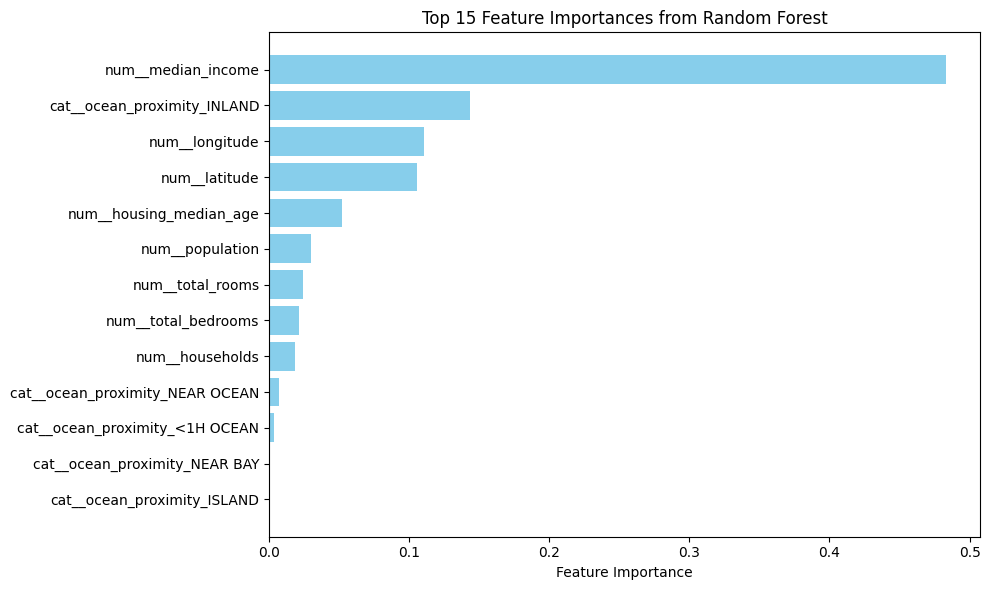

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Load the dataset
df = pd.read_csv("housing.csv")

# Drop rows with missing target
df = df.dropna(subset=["median_house_value"])

# Separate features and target
X = df.drop("median_house_value", axis=1)
y = df["median_house_value"].copy()

# Identify numerical and categorical columns
num_features = X.select_dtypes(include=[np.number]).columns.tolist()
cat_features = ["ocean_proximity"]

# Preprocessing pipelines
num_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])

full_pipeline = ColumnTransformer([
    ("num", num_pipeline, num_features),
    ("cat", OneHotEncoder(handle_unknown='ignore'), cat_features)
])

# Apply transformations
X_prepared = full_pipeline.fit_transform(X)

# Train the model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_prepared, y)

# Get feature importances
importances = model.feature_importances_
feature_names = full_pipeline.get_feature_names_out()
sorted_idx = np.argsort(importances)[-15:]

# Plot the top 15 features
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx)), importances[sorted_idx], align="center", color="skyblue")
plt.yticks(range(len(sorted_idx)), feature_names[sorted_idx])
plt.xlabel("Feature Importance")
plt.title("Top 15 Feature Importances from Random Forest")
plt.tight_layout()
plt.savefig("placeholder_feature_importance.png")
plt.show()
